## Load dependencies

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from matplotlib.colors import ListedColormap
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
import colorcet as cc
import pandas as pd
from ipyfilechooser import FileChooser
from linear2ac.io import get_main_data_folder
import zarr
import vr2p
import vr2p.signal

## Create single trial level tuning matrices for each cell, across all sessions


In [11]:
animal_name = 'Tyche-A7'

data = vr2p.ExperimentData(f'/.../Tyche/vr2p_datasets/Set A/{animal_name}-SetA.zarr')

bin_size = 5
min_speed = 5
track_size = 230
spatial_edges = np.arange(0,track_size + bin_size, bin_size)
mid_points = spatial_edges[1:]-(bin_size/2) # mid points of spatial bins.

all_fields_N = []
all_fields_F = []

day_ind_N = []
day_ind_F = []

for session in range(len(data.vr)):
    print(f'On Session {session}')
    vr = data.vr[session]
    trial = vr.trial.copy()
    position = vr.path.frame.copy().reset_index()
    # merge reward_id info
    position = position.merge(trial[['trial_number','reward_id']],on='trial_number')
    F = data.signals.multi_session.Fdemix[int(session)]
    F = F[:]
    F =  F-np.min(F,axis=1)[..., np.newaxis]
    # calculate df (Based on all frames.)
    dF_F0, _ = vr2p.signal.df_over_f0(F,'maximin',subtract_min=True,
        sigma_baseline=20, window_size = 200)

    for reward_id in [1,2]:
        #print(f'  On reward_id {reward_id}')

        
        selected_trials = trial.loc[(trial.reward_id == reward_id),'trial_number']
        selected_frames = position.loc[position['trial_number'].isin(selected_trials),'frame']
        position['speed'] = position.vr2p.rolling_speed(
            window_size = 100, ignore_threshold = 7.5)
        # filter frames with min speed and in 'selected_frames'
        filtered_frames = position.loc[(position['speed']>=min_speed) & position['frame'].isin(selected_frames),'frame']
        filtered_pos_data = position.loc[position['frame'].isin(filtered_frames),['frame','position','trial_number']]


        for trial_n in selected_trials:
            #print(f'On trial {trial_n}')


            single_pos_data = filtered_pos_data[filtered_pos_data.trial_number==trial_n]
        
            if len(single_pos_data.position) == 0 or (len(single_pos_data.position) > 0 and np.nanmax(single_pos_data.position) < 226):
  
                #print(f'    skipping incomplete trial {trial_n}')
                continue 
            bin_pos = single_pos_data.copy()
            # change trials to rank order (for filling out matrix).
            bin_pos['trial_number'] = (bin_pos['trial_number'].rank(method='dense')-1).astype(int)

            # Assign bin position.
            bin_pos['bin'] = pd.cut(bin_pos.position,spatial_edges, include_lowest=True,labels=False).to_numpy().astype(int)
            bin_pos = bin_pos.loc[bin_pos.bin>=0] # valid bins only.
            # prepare binF matrix.
            num_trials = bin_pos.trial_number.max()+1
            num_bins = spatial_edges.size-1
            num_cells = F.shape[0]
            if np.isnan(num_trials): num_trials=0
            binF_mat = np.full((num_trials,num_bins,num_cells),np.nan) # holds mean fluorescence data.
            # Get frames per trial and bin.
            bin_pos = bin_pos.groupby(['trial_number','bin']).agg({'frame':list})
            # get mean dF value for each bin, trial frame set.
            for index, row in bin_pos.iterrows():
                binF_mat[index[0],index[1],:] = np.mean(dF_F0[:,row['frame']],axis=1)

            binF_mat = np.swapaxes(binF_mat, 1, 2)
            
            
            if reward_id == 1:
                all_fields_N.append(binF_mat)
                day_ind_N.append(session)
            if reward_id == 2:
                all_fields_F.append(binF_mat)
                day_ind_F.append(session)

        
    

On Session 0
On Session 1
On Session 2
On Session 3
On Session 4
On Session 5
On Session 6
On Session 7
On Session 8


## Impute missing values due to speed thresholding. 

In [12]:
from sklearn.impute import SimpleImputer

new_all_N = np.squeeze(np.array(all_fields_N))
array_2d_N = new_all_N.reshape(-1, 46)

new_all_F = np.squeeze(np.array(all_fields_F))
array_2d_F = new_all_F.reshape(-1, 46)


# Create the SimpleImputer and specify the imputation strategy
imputer = SimpleImputer(strategy='median')

# Fit the imputer and transform the data to remove nan values. 
imputed_array_2d_N = imputer.fit_transform(array_2d_N)
imputed_array_2d_F = imputer.fit_transform(array_2d_F)


# Reshape the imputed 2D array back to 3D
imputed_array_3d_N = imputed_array_2d_N.reshape(*new_all_N.shape)
imputed_array_3d_F = imputed_array_2d_F.reshape(*new_all_F.shape)

## Quantify spatial dispersion by entropy

In [13]:
from skimage.measure import regionprops
    
def single_centers(session_data):
    '''function taking in place field object and output the 
       center of the strongest place field for each cell'''

    props = regionprops(session_data['label_im'],session_data['binF'], cache=False)
    mean_intensity = np.array([prop["mean_intensity"]for prop in props])

    num_cells = session_data['binF'].shape[0]
    single_centers = np.full(num_cells,np.inf)
    intensity = mean_intensity

    cell_id = session_data['centers'][:,0].astype(int)
    # in case a cell has two place fields, order on one with highest mean intensity.
    for icell in range(num_cells):
        cell_ind = np.argwhere(cell_id==icell)
        if cell_ind.size>0:
            ind = np.argmax(intensity[cell_id==icell])
            single_centers[icell] = session_data['centers'][cell_ind[ind],1]
    return single_centers

## Function for finding gray-zone-coding cells:
def gray_region_cell_ind(gray_regions,selected_sessions,trial_types):

    gray_region_ind = set()

    for session_n in selected_sessions:
        indices = []
        
        for trial_n in range(len(trial_types)):
            
            trial_type = trial_types[trial_n]
            
            centers = single_centers(trial_type[session_n]) / 5  # Get center positions for each cell

            for idx, center in enumerate(centers):
                # Ignore cells with np.inf center value
                if center == np.inf:
                    continue

                # Check if the center is in any of the gray regions
                center_in_gray_region = any([int(center) in gray_region for gray_region in gray_regions])

                if center_in_gray_region:
                    indices.append(idx)  # Add the index of the cell with the center in a gray region
            # Update the total set
            print(f"Function output: Session {session_n}, total: {len(gray_region_ind)} cells")
        gray_region_ind.update(set(indices))
    return np.array(list(gray_region_ind))

def pos_entropy(signal: np.ndarray) -> float:
    
    signal[signal<0] = 0
    # Normalize the signal to have a sum of 1, so that it acts like a probability distribution
    normalized_signal = signal / np.sum(signal)

    # Calculate the entropy of the normalized signal
    entropy = -np.sum(normalized_signal * np.log2(normalized_signal + np.finfo(float).eps))

    return entropy

In [14]:
gray_regions = [np.arange(0, 12), np.arange(20, 26), np.arange(30, 36), np.arange(40, 46)]
selected_sessions = [0,1,2]
trial_types = [pf_all_T1] ## analyzing only near trials for now

gray_region_ind = gray_region_cell_ind(gray_regions,selected_sessions,trial_types)

# take all animals date plot day 0 and day 2 entropy
entropy_1 = []
entropy_2 = []

cell_array = gray_region_ind


for i in cell_array:
    aa = imputed_array_3d_N[np.isin(np.array(day_ind_N), [0,1,2]),i,:]
    entropy_1.append(pos_entropy(np.mean(aa[0:60,:],0)))
    entropy_2.append(pos_entropy(np.mean(aa[60:,:],0)))
    
entropy_1 = np.array(entropy_1)
entropy_2 = np.array(entropy_2)

        

Function output: Session 0, total: 0 cells
Function output: Session 1, total: 2365 cells
Function output: Session 2, total: 3020 cells


In [15]:
high_change = cell_array[np.argsort(entropy_1 - entropy_2)[-200:]]
high_change_neg = cell_array[np.argsort(entropy_1 - entropy_2)[0:40]]

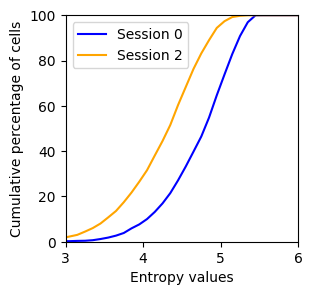

In [16]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(3, 3), dpi=100)

# Compute the entropy range and bin edges
entropy_min = 0
entropy_max = 10
nbins = 100
bin_edges = np.linspace(entropy_min, entropy_max, num= nbins + 1)

# Compute the binned entropy histograms for each session
hist_1, _ = np.histogram(entropy_1, bins=bin_edges)
hist_2, _ = np.histogram(entropy_2, bins=bin_edges)

# Compute the cumulative percentages for each bin
cumulative_percentage_1 = np.cumsum(hist_1) / len(entropy_1) * 100
cumulative_percentage_2 = np.cumsum(hist_2) / len(entropy_2) * 100

# Plot the cumulative percentages on the subplot
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
axs.plot(bin_centers, cumulative_percentage_1, color='blue', label='Session 0')
axs.plot(bin_centers, cumulative_percentage_2, color='orange', label='Session 2')

# Add labels and title to the subplot
axs.set_xlabel('Entropy values')
axs.set_ylabel('Cumulative percentage of cells')
axs.set_xlim([3, 6])
axs.set_ylim([0, 100])

# Add a legend to the plot
axs.legend()

# Show the plot
plt.show()


## Smooth the fluroescent signals and perform NMF

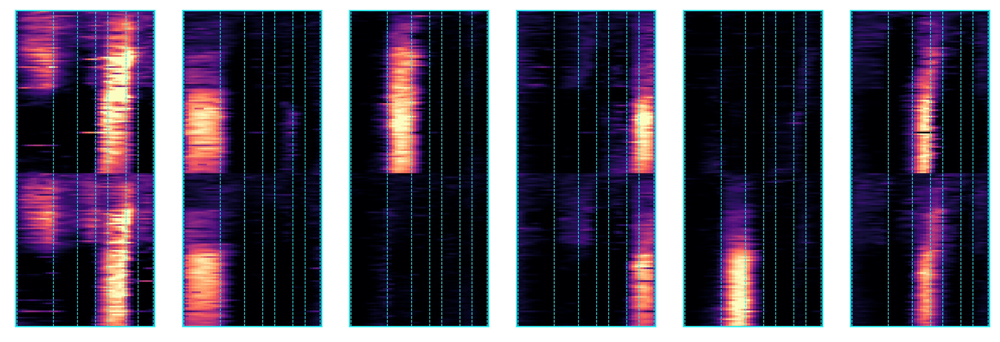

In [17]:
import scipy.signal

def smooth(arr, window = 3):
    # Define the smoothing kernel
    kernel = np.ones((1, window)) / window

    # Flatten the array along the 46-sized dimension
    arr_flat = arr.reshape((arr.shape[0], arr.shape[1]*arr.shape[2]))

    # Apply convolution along the flattened dimension
    smoothed_flat = scipy.signal.convolve2d(arr_flat, kernel, mode="same", boundary="symm")

    # Reshape the smoothed array back to the original shape
    return smoothed_flat.reshape((arr.shape[0], arr.shape[1], arr.shape[2]))


imputed_array_3d_N = smooth(imputed_array_3d_N)
imputed_array_3d_F = smooth(imputed_array_3d_F)


selected_sessions = [0,1,2]

day_num = max(day_count)

cell_num = len(gray_region_ind)
session_num = len(selected_sessions)
trial_num_N = np.isin(np.array(day_ind_N),selected_sessions).sum() 
trial_num_F = np.isin(np.array(day_ind_F),selected_sessions).sum() 

field_over_days_N = []
field_over_days_F = []


for cell_n in gray_region_ind:

    field_over_days_N.append(imputed_array_3d_N[0:trial_num_N, cell_n,:])
    field_over_days_F.append(imputed_array_3d_F[0:trial_num_F, cell_n,:])


field_over_days_N = np.array(field_over_days_N)
field_over_days_F = np.array(field_over_days_F)


total_data = np.concatenate((field_over_days_N, field_over_days_F), axis=1)


total_data_linearized = np.reshape(total_data,(total_data.shape[0],-1)) 

import sklearn.decomposition as decomposition
total_data_linearized[total_data_linearized<0] = 0

nmf_comps = 6

nmf_estimator = decomposition.NMF(n_components=nmf_comps,max_iter=1000, tol=5e-4)
zz = nmf_estimator.fit_transform(total_data_linearized)  # original non- negative dataset
fig = plt.figure(figsize=(2*nmf_comps, 4),dpi = 600)
for i in range(nmf_comps):
    ax = fig.add_subplot(1, nmf_comps, i + 1, xticks=[], yticks=[])
    im = ax.imshow(nmf_estimator.components_[i].reshape(total_data[0].shape),
              cmap='magma',aspect = 'auto',vmin = 0,vmax = 1.5)
    ax.spines['bottom'].set_color('cyan')
    ax.spines['left'].set_color('cyan')
    ax.spines['top'].set_color('cyan')
    ax.spines['right'].set_color('cyan')
    #plt.colorbar(im)
    #ax.title.set_text(f'NMF {i}')
#     ax.axvspan(26,30,facecolor='w',edgecolor = 'w',linewidth=1,linestyle = '--',alpha = 0.2)
#     ax.axvspan(36,40,facecolor='w',edgecolor = 'w',linewidth=1,linestyle = '--',alpha = 0.2)
#     ax.axvspan(12,20,facecolor='w',edgecolor = 'w',linewidth=1,linestyle = '--',alpha = 0.2)
    plt.axvline(x=0, color="cyan", linestyle="--",linewidth = 0.5 )
    plt.axvline(x=12, color="cyan", linestyle="--",linewidth = 0.5 )

    plt.axvline(x=20, color="cyan", linestyle="--",linewidth = 0.5 )
    plt.axvline(x=26, color="cyan", linestyle="--",linewidth = 0.5 )
      

    plt.axvline(x=30, color="cyan", linestyle="--",linewidth = 0.5 )
    plt.axvline(x=36, color="cyan", linestyle="--",linewidth = 0.5 )
    
    plt.axvline(x=40, color="cyan", linestyle="--",linewidth = 0.5 )
    plt.axvline(x=45, color="cyan", linestyle="--",linewidth = 0.5 )







0
1
2
3


/tmp/ipykernel_840341/3609609641.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


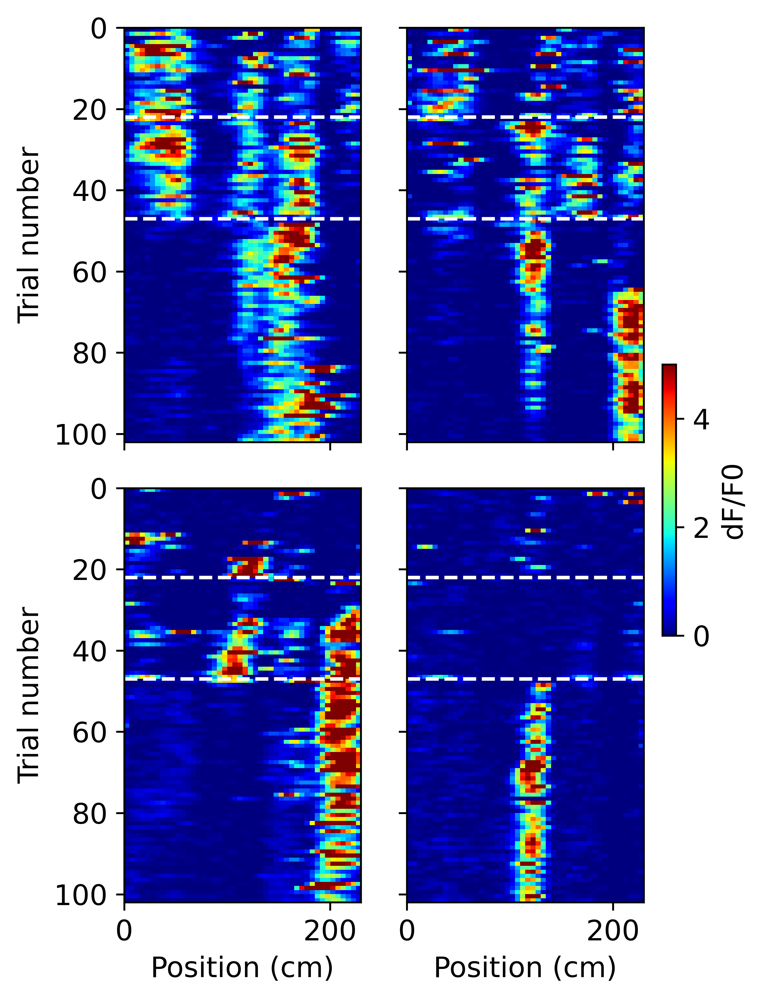

In [36]:
import figrid as fg


cell_num = [462,3308,766,5097]

vmin = 0
vmax = 5
region_marker_opacity = 0.1
dpi = 600

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(4,6), dpi=dpi, facecolor='white', sharex=True, sharey=True)

for i, ax in enumerate(axs.flat):
    # select data for day 0, 1, and 2
    selected_days = np.isin(np.array(day_ind_N), [0,1,2])
    selected_day_ind = np.array(day_ind_N)[selected_days]
    selected_data = imputed_array_3d_N[selected_days, cell_num[i], :]
    
    # plot heatmap.
    x_extent = (0, 230, selected_data.shape[0], 0)
    h = ax.imshow(selected_data, aspect='auto', cmap='jet', vmin=vmin, vmax=vmax, interpolation=None, extent=x_extent)

    # format axis.
    print(i)
    if i >= 2:
        ax.set_xlabel('Position (cm)', fontsize=12)
    if i % 2 == 0:
        ax.set_ylabel('Trial number', fontsize=12)
    else:
        ax.set_ylabel('', fontsize=12)
    ax.tick_params(axis='both', labelsize=12)

    # draw white dashed lines at the transitions between days
    day_changes = np.where(np.diff(selected_day_ind) != 0)[0]  # find indices where day changes
    for day_change in day_changes:
        ax.axhline(day_change, color='white', linestyle='--')  # add dashed line

    #ax.set_title(f'Cell {cell_num[i]}', fontsize=12)

# colorbar.
cbar = fig.colorbar(h, ax=axs.ravel().tolist(), label='dF/F0')
cbar.ax.set_position([0.99, 0.1, 0.02, 0.8])
cbar.ax.set_ylabel('dF/F0', fontsize=12)
cbar.ax.yaxis.set_tick_params(labelsize=12)

plt.tight_layout()
plt.savefig('figure.pdf', format='pdf', dpi=500) # This line saves the plot as a pdf with dpi = 500
plt.show()


## Visualize place fields over trials

In [29]:
# cell_array = gray_region_ind

cell_array = high_change ## selecting high entropy decrease cells

# Determine the number of rows and columns for the subplots
num_cols = 15
num_rows = int(np.ceil(len(cell_array) / num_cols ))

#vmax = np.nanmax(imputed_array_3d_N[np.isin(np.array(day_ind_N), [0,1,2]),index,:]) / 2

vmax = 4.5
# Create the subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(40, 4*num_rows), dpi=300)

# Iterate over the indices to plot
for i, ax in enumerate(axs.flatten()):
    if i < len(cell_array):
        index = cell_array[i]
        im = ax.imshow(imputed_array_3d_N[np.isin(np.array(day_ind_N), [0,1,2]),index,:], aspect='auto', cmap='jet', vmin=0, vmax=vmax, interpolation=None)
        ax.set_title(f"Cell {index}")
        fig.colorbar(im, ax=ax)


# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.3)

# Show the plot
plt.show()


## Functions for using strongest place field's center postion to check if a cell is coding for the "Gray zones"

In [18]:
from skimage.measure import regionprops
    
def single_centers(session_data):
    '''function taking in place field object and output the 
       center of the strongest place field for each cell'''

    props = regionprops(session_data['label_im'],session_data['binF'], cache=False)
    mean_intensity = np.array([prop["mean_intensity"]for prop in props])

    num_cells = session_data['binF'].shape[0]
    single_centers = np.full(num_cells,np.inf)
    intensity = mean_intensity

    cell_id = session_data['centers'][:,0].astype(int)
    # in case a cell has two place fields, order on one with highest mean intensity.
    for icell in range(num_cells):
        cell_ind = np.argwhere(cell_id==icell)
        if cell_ind.size>0:
            ind = np.argmax(intensity[cell_id==icell])
            single_centers[icell] = session_data['centers'][cell_ind[ind],1]
    return single_centers

## Function for finding gray-zone-coding cells:
def gray_region_cell_ind(gray_regions,selected_sessions,trial_types):

    gray_region_ind = set()

    for session_n in selected_sessions:
        indices = []
        
        for trial_n in range(len(trial_types)):
            
            trial_type = trial_types[trial_n]
            
            centers = single_centers(trial_type[session_n]) / 5  # Get center positions for each cell

            for idx, center in enumerate(centers):
                # Ignore cells with np.inf center value
                if center == np.inf:
                    continue

                # Check if the center is in any of the gray regions
                center_in_gray_region = any([int(center) in gray_region for gray_region in gray_regions])

                if center_in_gray_region:
                    indices.append(idx)  # Add the index of the cell with the center in a gray region
            # Update the total set
            print(f"Function output: Session {session_n}, total: {len(gray_region_ind)} cells")
            gray_region_ind.update(set(indices))
    return np.array(list(gray_region_ind))

def pos_entropy(signal: np.ndarray) -> float:
    
    signal[signal<0] = 0
    # Normalize the signal to have a sum of 1, so that it acts like a probability distribution
    normalized_signal = signal / np.sum(signal)

    # Calculate the entropy of the normalized signal
    entropy = -np.sum(normalized_signal * np.log2(normalized_signal + np.finfo(float).eps))

    return entropy


## Analyze spatial dispersion for all animals

In [ ]:
import os
anm = os.listdir('/nrs/spruston/Tyche/vr2p_datasets/Set A/')
animal_list = [name[0:8] for name in anm]
animal_list = animal_list[1:] ## removing .DS_Stor file

gray_regions = [np.arange(0, 12), np.arange(20, 26), np.arange(30, 36), np.arange(40, 46)]

selected_sessions = [0,1,2]

all_anm_entropy_s0 = []
all_anm_entropy_s2 = []

for animal_name in animal_list:
    print(animal_name)
    
    #load stored place field analysis for each day
    zarr_file = zarr.open(f'/nrs/spruston/Tyche/vr2p_datasets/placefields/50_600_SetA/{animal_name}-PF.zarr', mode="r")
    
    num_A_days = len(zarr_file[f'Cue Set A/1/excl_no_response/'])
    
    range_A = range(num_A_days)
    criteria = 'significant'
    
    pf_all_T1 = [zarr_file[f'Cue Set A/1/excl_no_response/{i}/{criteria}'][()] for i in range_A]
    pf_all_T2 = [zarr_file[f'Cue Set A/2/excl_no_response/{i}/{criteria}'][()] for i in range_A]

    binF_T1 = [zarr_file[f'Cue Set A/1/excl_no_response/{i}/{criteria}'][()]['binF'] for i in range_A]
    binF_T2 = [zarr_file[f'Cue Set A/2/excl_no_response/{i}/{criteria}'][()]['binF'] for i in range_A]

    binF_T1_all = np.array(binF_T1).T
    binF_T2_all = np.array(binF_T2).T
    
    
    # find gray indices for session 0,1,2
    trial_types = [pf_all_T1] ## analyzing only near trials for now
    gray_region_ind = gray_region_cell_ind(gray_regions,selected_sessions,trial_types)

    # take all animals date plot day 0 and day 2 entropy
    entropy_session_0 = []
    entropy_session_2 = []

    cell_array = gray_region_ind
    
    for cell_ind in cell_array:

        entropy_session_0.append(pos_entropy(binF_T1_all[:,cell_ind,0]))
        entropy_session_2.append(pos_entropy(binF_T1_all[:,cell_ind,2]))

    all_anm_entropy_s0.append(entropy_session_0)
    all_anm_entropy_s2.append(entropy_session_2)

## Plotting entropies

In [21]:
# Compute the entropy range and bin edges
entropy_min = 0
entropy_max = 10
nbins = 100
bin_edges = np.linspace(entropy_min, entropy_max, num= nbins + 1)

cumulative_fraction_s0 = []
cumulative_fraction_s2 = []

for entropy in all_anm_entropy_s0:
    
    hist, _ = np.histogram(entropy, bins=bin_edges)
    cumulative_fraction = np.cumsum(hist) / len(entropy) 
    cumulative_fraction_s0.append(cumulative_fraction)
    
cumulative_fraction_s2 = []
for entropy in all_anm_entropy_s2:
    
    hist, _ = np.histogram(entropy, bins=bin_edges)
    cumulative_fraction = np.cumsum(hist) / len(entropy) 
    cumulative_fraction_s2.append(cumulative_fraction)
    
cumulative_fraction_s0 = np.array(cumulative_fraction_s0)
cumulative_fraction_s2 = np.array(cumulative_fraction_s2)

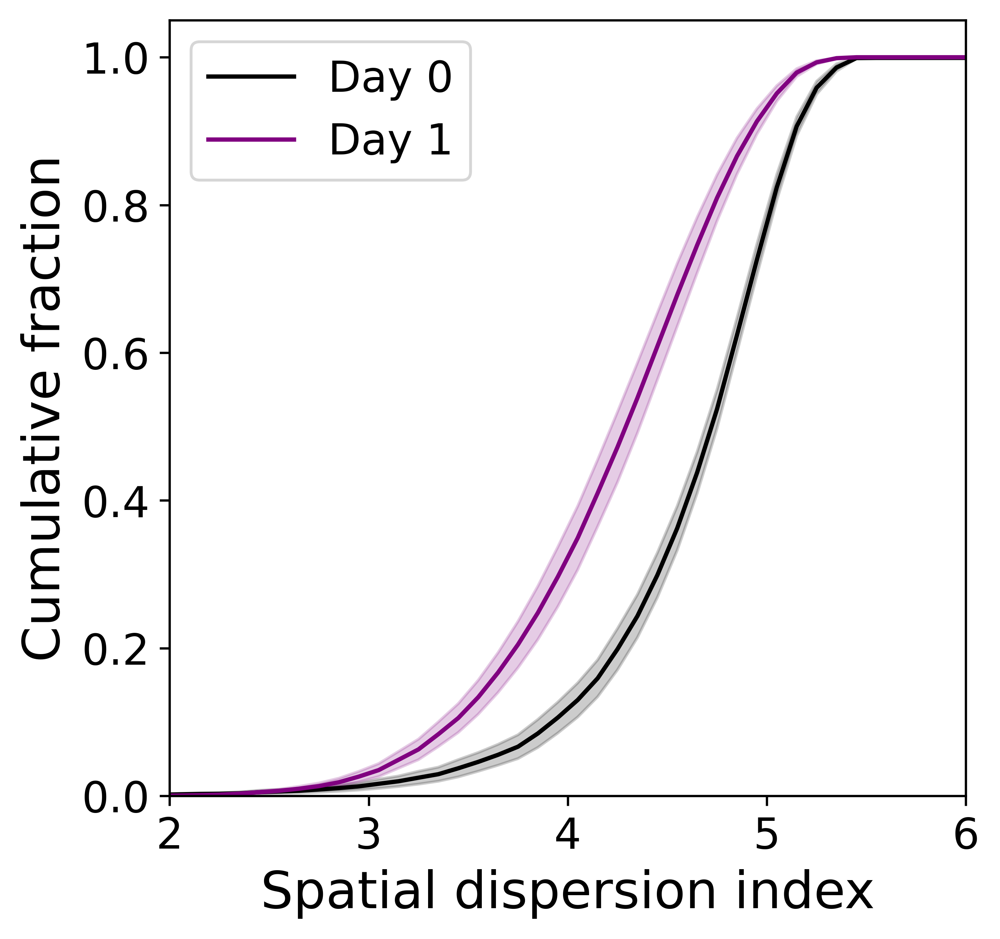

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate the mean and standard error of the mean for each array along the 0th dimension
mean_s0 = np.mean(cumulative_fraction_s0, axis=0)
sem_s0 = np.std(cumulative_fraction_s0, axis=0) / np.sqrt(cumulative_fraction_s0.shape[0])
mean_s2 = np.mean(cumulative_fraction_s2, axis=0)
sem_s2 = np.std(cumulative_fraction_s2, axis=0) / np.sqrt(cumulative_fraction_s2.shape[0])

# Set up the plot
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5, 5), dpi=600)

# Plot the means with shaded error bars
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
axs.plot(bin_centers, mean_s0, color='black', label='Day 0')
axs.fill_between(bin_centers, mean_s0 - sem_s0, mean_s0 + sem_s0, alpha=0.2, color='black')
axs.plot(bin_centers, mean_s2, color='purple', label='Day 1')
axs.fill_between(bin_centers, mean_s2 - sem_s2, mean_s2 + sem_s2, alpha=0.2, color='purple')

# Add labels and title to the subplot
axs.set_xlabel('Spatial dispersion index', fontsize=18)
axs.set_ylabel('Cumulative fraction', fontsize=18)
axs.set_xlim([2, 6])
axs.set_ylim([0, 1.05])
axs.tick_params(labelsize=15)

# Add a legend to the plot
axs.legend(fontsize=15)

# Save the plot as a PDF with dpi=500
plt.savefig('spatial_dispersion.pdf', format='pdf', dpi=500)

# Show the plot
plt.show()


In [37]:
# Flatten the arrays
all_anm_entropy_s0_flat = np.concatenate(all_anm_entropy_s0)
all_anm_entropy_s2_flat= np.concatenate(all_anm_entropy_s2)

# Remove any NaN values
all_anm_entropy_s0_flat  = all_anm_entropy_s0_flat [~np.isnan(all_anm_entropy_s0_flat )]
all_anm_entropy_s2_flat = all_anm_entropy_s2_flat[~np.isnan(all_anm_entropy_s2_flat)]


In [38]:
# Perform the Mann-Whitney U test
U, p_value = stats.mannwhitneyu(all_anm_entropy_s0_flat, all_anm_entropy_s2_flat, alternative='two-sided')

# Print the result
print("Mann-Whitney U statistic:", U)

if p_value == 0:
    print("p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).")
else:
    print("p-value:", p_value)

print("The Mann-Whitney U test showed a statistically significant difference between the two groups (U = 302559180.0, p < 0.000001)")


Mann-Whitney U statistic: 302559180.0
p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).
The Mann-Whitney U test showed a statistically significant difference between the two groups (U = 302559180.0, p < 0.000001)


In [39]:
# Perform the Wilcoxon rank-sum test
W, p_value = stats.ranksums(all_anm_entropy_s0_flat, all_anm_entropy_s2_flat)

# Print the result
print("Wilcoxon rank-sum statistic:", W)

if p_value == 0:
    print("p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).")
else:
    print("p-value:", p_value)

print("The Wilcoxon rank-sum test showed a statistically significant difference between the two groups (W = {}, p < 0.000001)".format(W))


Wilcoxon rank-sum statistic: 77.12729456178307
p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).
The Wilcoxon rank-sum test showed a statistically significant difference between the two groups (W = 77.12729456178307, p < 0.000001)


## Stage 2 to 3 transition: Pre-R2 - R2

In [66]:
def Pre_R2_region_cell_ind(Pre_R2_region,selected_sessions,trial_types):

    Pre_R2_region_ind = set()

    for session_n in selected_sessions:
        indices = []
        
        for trial_n in range(len(trial_types)):
            
            trial_type = trial_types[trial_n]
            
            centers = single_centers(trial_type[session_n]) / 5  # Get center positions for each cell

            for idx, center in enumerate(centers):
                # Ignore cells with np.inf center value
                if center == np.inf:
                    continue
                center_in_region = any([int(center) in Pre_R2_region])

                if center_in_region:
                    indices.append(idx)  
            # Update the total set
            print(f"Function output: Session {session_n}, total: {len(Pre_R2_region_ind)} cells")
            Pre_R2_region_ind.update(set(indices))
    return np.array(list(Pre_R2_region_ind))

In [67]:
# Extract data for all animals, for each, find significant cell field centers within the range. 

import os
anm = os.listdir('/nrs/spruston/Tyche/vr2p_datasets/Set A/')
animal_list = [name[0:8] for name in anm]
animal_list = animal_list[1:] ## removing .DS_Stor

# Define Region 
Pre_R2_region = np.arange(34, 37)

all_anm_Pre_R2_diff = []
Pre_R2_region_ind_all = []

for animal_name in animal_list:
    print(animal_name)
    #load stored place field analysis for each day
    zarr_file = zarr.open(f'/nrs/spruston/Tyche/vr2p_datasets/placefields/50_600_SetA/{animal_name}-PF.zarr', mode="r")

    num_A_days = len(zarr_file[f'Cue Set A/1/excl_no_response/'])

    range_A = range(num_A_days)
    criteria = 'significant'

    pf_all_T1 = [zarr_file[f'Cue Set A/1/excl_no_response/{i}/{criteria}'][()] for i in range_A]
    pf_all_T2 = [zarr_file[f'Cue Set A/2/excl_no_response/{i}/{criteria}'][()] for i in range_A]

    binF_T1 = [zarr_file[f'Cue Set A/1/excl_no_response/{i}/{criteria}'][()]['binF'] for i in range_A]
    binF_T2 = [zarr_file[f'Cue Set A/2/excl_no_response/{i}/{criteria}'][()]['binF'] for i in range_A]

    binF_T1_all = np.array(binF_T1).T
    binF_T2_all = np.array(binF_T2).T

    selected_sessions = range_A

    trial_types = [pf_all_T1,pf_all_T2] ## analyzing only near trials for now

    Pre_R2_region_ind = Pre_R2_region_cell_ind(Pre_R2_region,selected_sessions,trial_types)
    Pre_R2_region_ind_all.append(Pre_R2_region_ind)
    anm_diff = []
    for session_n in range_A:
        diff = np.mean(binF_T1_all[:,Pre_R2_region_ind ,session_n][Pre_R2_region,:],0) \
            - np.mean(binF_T2_all[:,Pre_R2_region_ind ,session_n][Pre_R2_region,:],0)
        #diff[diff>0] = 0 ###############################selecting T2 >T1! remove after testing.
        anm_diff.append(diff)
    all_anm_Pre_R2_diff.append(anm_diff)

Tyche-A4
Function output: Session 0, total: 0 cells
Function output: Session 0, total: 11 cells
Function output: Session 1, total: 21 cells
Function output: Session 1, total: 43 cells
Function output: Session 2, total: 54 cells
Function output: Session 2, total: 65 cells
Function output: Session 3, total: 77 cells
Function output: Session 3, total: 109 cells
Function output: Session 4, total: 312 cells
Function output: Session 4, total: 427 cells
Function output: Session 5, total: 443 cells
Function output: Session 5, total: 551 cells
Function output: Session 6, total: 647 cells
Function output: Session 6, total: 757 cells
Function output: Session 7, total: 868 cells
Function output: Session 7, total: 887 cells
Function output: Session 8, total: 1049 cells
Function output: Session 8, total: 1079 cells
Function output: Session 9, total: 1106 cells
Function output: Session 9, total: 1127 cells
Tyche-A5
Function output: Session 0, total: 0 cells
Function output: Session 0, total: 18 cells

Function output: Session 0, total: 0 cells
Function output: Session 0, total: 37 cells
Function output: Session 1, total: 146 cells
Function output: Session 1, total: 214 cells
Function output: Session 2, total: 322 cells
Function output: Session 2, total: 405 cells
Function output: Session 3, total: 486 cells
Function output: Session 3, total: 516 cells
Function output: Session 4, total: 569 cells
Function output: Session 4, total: 634 cells
Function output: Session 5, total: 713 cells
Function output: Session 5, total: 726 cells


In [68]:
diff_min = 0
diff_max = 6
nbins = 100
bin_edges = np.linspace(diff_min, diff_max, num= nbins + 1)

cumulative_fraction_all_s0 = []
animal_diff_all_s0 = []
for diff in all_anm_Pre_R2_diff:
    anm_diff = np.abs(np.array(diff)[0,:])
    animal_diff_all_s0.append(anm_diff)
    #anm_diff = np.abs(np.array(diff)[0,:][np.array(diff)[0,:]<0])  ## selecting Far > Near
    
    hist, _ = np.histogram(anm_diff, bins=bin_edges)
    cumulative_fraction = np.cumsum(hist) / len(anm_diff) 
    cumulative_fraction_all_s0.append(cumulative_fraction)
    
    
    
cumulative_fraction_all_s_end = []
animal_diff_all_end = []

for diff in all_anm_Pre_R2_diff:
    anm_diff = np.abs(np.array(diff)[-1,:])
    animal_diff_all_end.append(anm_diff)
    #anm_diff = np.abs(np.array(diff)[-1,:][np.array(diff)[-1,:]<0])
    
    hist, _ = np.histogram(anm_diff, bins=bin_edges)
    cumulative_fraction = np.cumsum(hist) / len(anm_diff) 
    cumulative_fraction_all_s_end.append(cumulative_fraction)
    
    
cumulative_fraction_all_s0 = np.array(cumulative_fraction_all_s0)
cumulative_fraction_all_s_end = np.array(cumulative_fraction_all_s_end)

In [70]:
# Flatten the arrays
animal_diff_all_s0_flat = np.concatenate(animal_diff_all_s0)
animal_diff_all_end_flat= np.concatenate(animal_diff_all_end)

# Remove any NaN values
animal_diff_all_s0_flat = animal_diff_all_s0_flat [~np.isnan(animal_diff_all_s0_flat)]
animal_diff_all_end_flat = animal_diff_all_end_flat[~np.isnan(animal_diff_all_end_flat)]


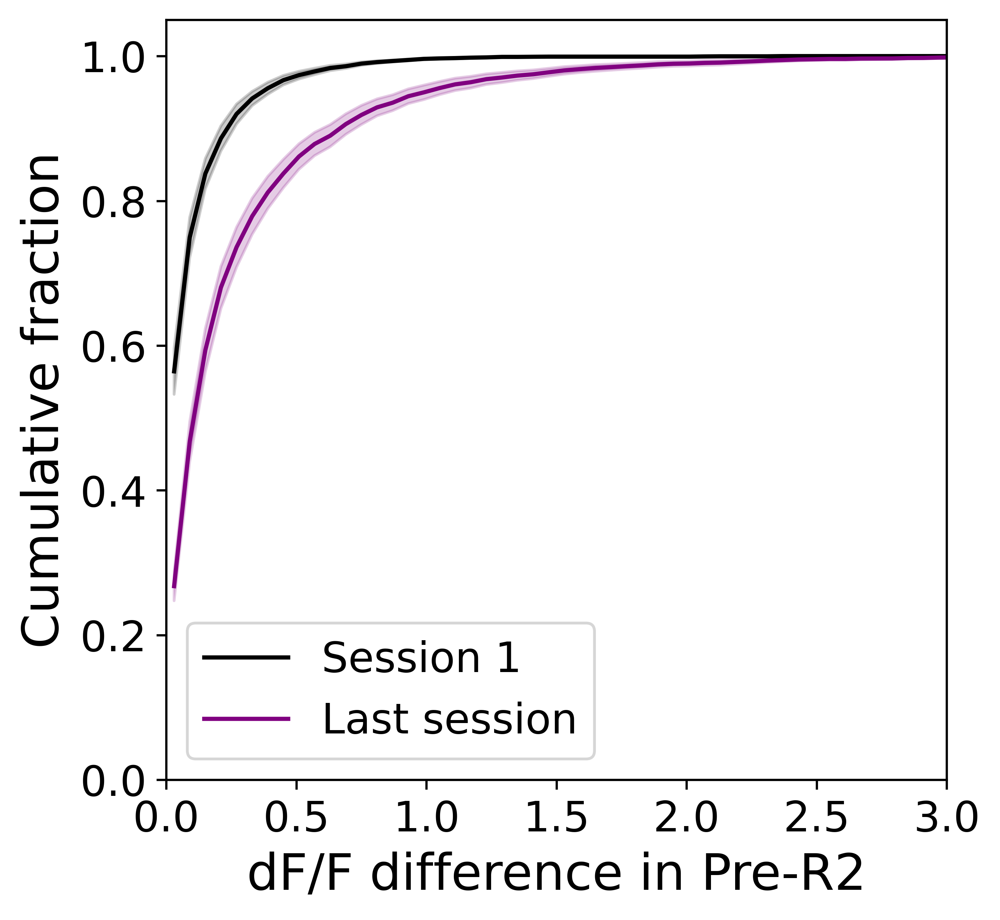

In [43]:
# Calculate the mean and standard error of the mean for each array along the 0th dimension
mean_s0 = np.mean(cumulative_fraction_all_s0, axis=0)
sem_s0 = np.std(cumulative_fraction_all_s0, axis=0) / np.sqrt(cumulative_fraction_all_s0.shape[0])
mean_s_end = np.mean(cumulative_fraction_all_s_end, axis=0)
sem_s_end = np.std(cumulative_fraction_all_s_end, axis=0) / np.sqrt(cumulative_fraction_all_s_end.shape[0])

# Set up the plot
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5, 5), dpi=600)

# Plot the means with shaded error bars
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
axs.plot(bin_centers, mean_s0, color='black', label='Session 1')
axs.fill_between(bin_centers, mean_s0 - sem_s0, mean_s0 + sem_s0, alpha=0.2, color='black')
axs.plot(bin_centers, mean_s_end, color='purple', label='Last session')
axs.fill_between(bin_centers, mean_s_end - sem_s_end, mean_s_end + sem_s_end, alpha=0.2, color='purple')

# Add labels and title to the subplot
axs.set_xlabel('dF/F difference in Pre-R2', fontsize=18)
axs.set_ylabel('Cumulative fraction', fontsize=18)
axs.set_xlim([0, 3])
axs.set_ylim([0, 1.05])
axs.tick_params(labelsize=15)

# Add a legend to the plot
axs.legend(fontsize=15)
plt.savefig('stage_2_to_3.pdf', format='pdf', dpi=500)

# Show the plot
plt.show()



## do Wilcoxon rank-sum test, two-sided. 

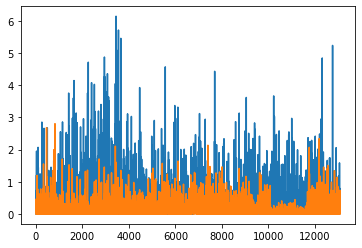

In [78]:
plt.plot(animal_diff_all_end_flat)
plt.plot(animal_diff_all_s0_flat)

In [79]:
W, p_value_W = stats.ranksums(animal_diff_all_s0_flat, animal_diff_all_end_flat)


In [81]:
from scipy import stats

# Perform the Mann-Whitney U test
U, p_value_U = stats.mannwhitneyu(animal_diff_all_s0_flat, animal_diff_all_end_flat, alternative='two-sided')

# Print the Mann-Whitney U result
print("Mann-Whitney U statistic:", U)
print("Mann-Whitney U p-value:", p_value_U)
if p_value_U == 0:
    print("Mann-Whitney U p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).")
else:
    print("Mann-Whitney U p-value:", p_value_U)

# Perform the Wilcoxon Rank Sum test
W, p_value_W = stats.ranksums(animal_diff_all_s0_flat, animal_diff_all_end_flat)

# Print the Wilcoxon Rank Sum result
print("Wilcoxon Rank Sum statistic:", W)
print("Wilcoxon Rank Sum p-value:", p_value_W)
if p_value_W == 0:
    print("Wilcoxon Rank Sum p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).")
else:
    print("Wilcoxon Rank Sum p-value:", p_value_W)

# Print statement about statistical significance 
print("If the p-value is less than 0.05, the Wilcoxon rank-sum test shows a statistically significant difference between the two groups.")


Mann-Whitney U statistic: 51920102.0
Mann-Whitney U p-value: 0.0
Mann-Whitney U p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).
Wilcoxon Rank Sum statistic: -55.19042740221836
Wilcoxon Rank Sum p-value: 0.0
Wilcoxon Rank Sum p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).
If the p-value is less than 0.05, the Wilcoxon rank-sum test shows a statistically significant difference between the two groups.


In [82]:
sorted_ind = Pre_R2_region_ind_all[2][np.argsort(np.abs(all_anm_Pre_R2_diff[2][-1]))]

In [83]:
#load stored place field analysis for each day
zarr_file = zarr.open(f'/nrs/spruston/Tyche/vr2p_datasets/placefields/50_600_SetA/Tyche-A7-PF.zarr', mode="r")

num_A_days = len(zarr_file[f'Cue Set A/1/excl_no_response/'])

range_A = range(num_A_days)
criteria = 'significant'

pf_all_T1 = [zarr_file[f'Cue Set A/1/excl_no_response/{i}/{criteria}'][()] for i in range_A]
pf_all_T2 = [zarr_file[f'Cue Set A/2/excl_no_response/{i}/{criteria}'][()] for i in range_A]

binF_T1 = [zarr_file[f'Cue Set A/1/excl_no_response/{i}/{criteria}'][()]['binF'] for i in range_A]
binF_T2 = [zarr_file[f'Cue Set A/2/excl_no_response/{i}/{criteria}'][()]['binF'] for i in range_A]

binF_T1_all = np.array(binF_T1).T
binF_T2_all = np.array(binF_T2).T

In [ ]:
cell_array = sorted_ind[-400:]
session_range = np.arange(9)
# Determine the number of rows and columns for the subplots
num_cols = 10
num_rows = int(np.ceil(len(cell_array) / num_cols ))

x_start = 34
x_end = 37
vmax = 4
# Create the subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 4*num_rows), dpi=300)

# Iterate over the indices to plot
for i, ax in enumerate(axs.flatten()):
    if i < len(cell_array):
        index = cell_array[i]
        stacked_Near_Far = np.hstack((binF_T1_all[:,index,:],binF_T2_all[:,index,:])).T
        im = ax.imshow(stacked_Near_Far, aspect='auto', cmap='jet', vmin=0, vmax=vmax, interpolation=None)
        ax.set_title(f"Cell {index}")
        fig.colorbar(im, ax=ax)
        ax.axvline(x=x_start, linestyle='--', color='white', linewidth=1)
        ax.axvline(x=x_end, linestyle='--', color='white', linewidth=1)
        ax.axhline(y=9, linestyle='--', color='white', linewidth=1)



# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.3)

# Show the plot
plt.show()


0
1
2
3


/tmp/ipykernel_840341/1334386292.py:55: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


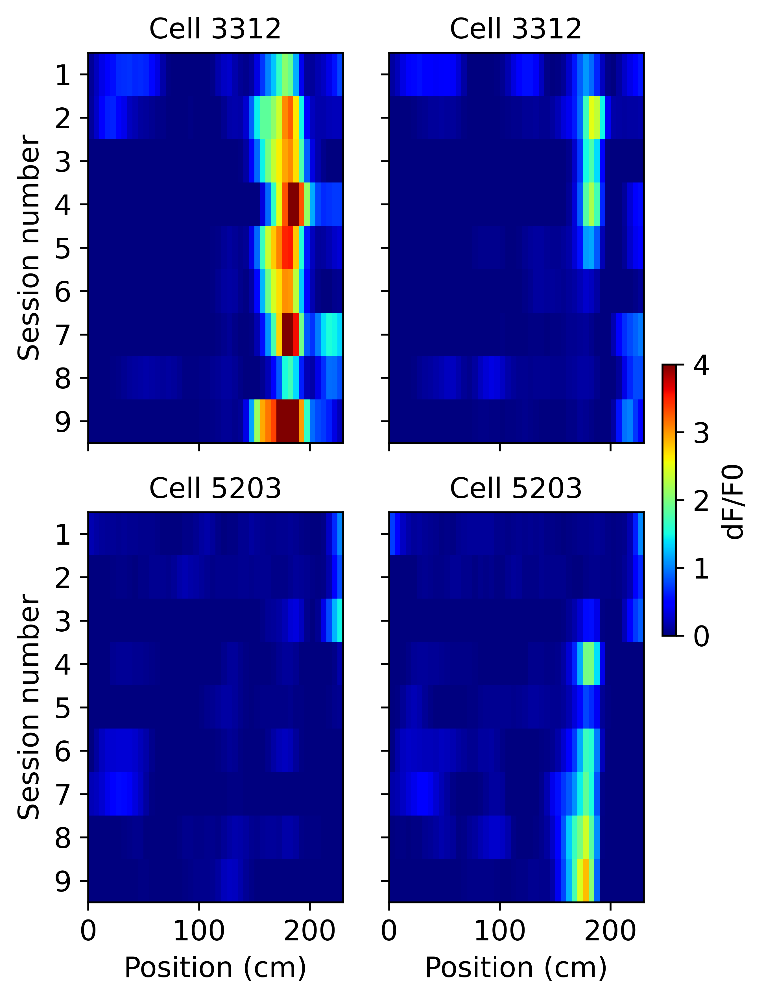

In [113]:
cell_num = [3312,5203]

x_start = 34*5
x_end = 37*5

vmin = 0
vmax = 4
region_marker_opacity = 0.1
dpi = 600

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(4,6), dpi=dpi, facecolor='white', sharex=True, sharey=True)

for i, ax in enumerate(axs.flat):
    q,r = divmod(i, 2) 
    # plot heatmap.
    if r == 0:
        x_extent = (0, 230,binF_T1_all[:,cell_num[q],:].T.shape[0],0)
        h = ax.imshow(binF_T1_all[:,cell_num[q],:].T, aspect='auto', cmap='jet', vmin=vmin, vmax=vmax, interpolation=None, extent=x_extent)
        ax.set_title(f'Cell {cell_num[q]}', fontsize=12)
    if r == 1:
        x_extent = (0, 230,binF_T2_all[:,cell_num[q],:].T.shape[0],0)
        h = ax.imshow(binF_T2_all[:,cell_num[q],:].T, aspect='auto', cmap='jet', vmin=vmin, vmax=vmax, interpolation=None, extent=x_extent)
        ax.set_title(f'Cell {cell_num[q]}', fontsize=12)

    # format axis.
    print(i)
    if i >= 2:
        ax.set_xlabel('Position (cm)', fontsize=12)
    if i % 2 == 0:
        ax.set_ylabel('Session number', fontsize=12)
        y_ticks = np.arange(0.5, 9.5)
        ylabels = [str(i) for i in range(1, 10)]  

        ax.set_yticks(y_ticks)
        ax.set_yticklabels(ylabels)
        
    else:
        ax.set_ylabel('', fontsize=12)
    ax.tick_params(axis='both', labelsize=12)
    #ax.set_title(f'Cell {cell_num[i]}', fontsize=12)
#     ax.axvline(x=x_start, linestyle='--', color='white', linewidth=1)
#     ax.axvline(x=x_end, linestyle='--', color='white', linewidth=1)



# colorbar.
# colorbar.
cbar = fig.colorbar(h, ax=axs.ravel().tolist(), label='dF/F0')
cbar.ax.set_position([0.99, 0.1, 0.02, 0.8])
cbar.ax.set_ylabel('dF/F0', fontsize=12)
cbar.ax.yaxis.set_tick_params(labelsize=12)

plt.tight_layout()
plt.savefig('Example_stage_2_3_cells.pdf', format='pdf', dpi=500) # This line saves the plot as a pdf with dpi = 500

plt.show()


## Stage 2 to 3 transition: Pre-R1 - R1

In [84]:
def Pre_R1_region_cell_ind(Pre_R1_region,selected_sessions,trial_types):

    Pre_R1_region_ind = set()

    for session_n in selected_sessions:
        indices = []
        
        for trial_n in range(len(trial_types)):
            
            trial_type = trial_types[trial_n]
            
            centers = single_centers(trial_type[session_n]) / 5  # Get center positions for each cell

            for idx, center in enumerate(centers):
                # Ignore cells with np.inf center value
                if center == np.inf:
                    continue
                center_in_region = any([int(center) in Pre_R1_region])

                if center_in_region:
                    indices.append(idx)  
            # Update the total set
            print(f"Function output: Session {session_n}, total: {len(Pre_R1_region_ind)} cells")
            Pre_R1_region_ind.update(set(indices))
    return np.array(list(Pre_R1_region_ind))

In [85]:
# Extract data for all animals, for each, find significant cell field centers within the range. 

import os
anm = os.listdir('/nrs/spruston/Tyche/vr2p_datasets/Set A/')
animal_list = [name[0:8] for name in anm]
animal_list = animal_list[1:] ## removing .DS_Stor

# Define Region 
Pre_R1_region = np.arange(24, 27)

all_anm_Pre_R1_diff = []
Pre_R1_region_ind_all = []

for animal_name in animal_list:
    print(animal_name)
    #load stored place field analysis for each day
    zarr_file = zarr.open(f'/nrs/spruston/Tyche/vr2p_datasets/placefields/50_600_SetA/{animal_name}-PF.zarr', mode="r")

    num_A_days = len(zarr_file[f'Cue Set A/1/excl_no_response/'])

    range_A = range(num_A_days)
    criteria = 'significant'

    pf_all_T1 = [zarr_file[f'Cue Set A/1/excl_no_response/{i}/{criteria}'][()] for i in range_A]
    pf_all_T2 = [zarr_file[f'Cue Set A/2/excl_no_response/{i}/{criteria}'][()] for i in range_A]

    binF_T1 = [zarr_file[f'Cue Set A/1/excl_no_response/{i}/{criteria}'][()]['binF'] for i in range_A]
    binF_T2 = [zarr_file[f'Cue Set A/2/excl_no_response/{i}/{criteria}'][()]['binF'] for i in range_A]

    binF_T1_all = np.array(binF_T1).T
    binF_T2_all = np.array(binF_T2).T

    selected_sessions = range_A

    trial_types = [pf_all_T1,pf_all_T2] ## analyzing only near trials for now

    Pre_R1_region_ind = Pre_R1_region_cell_ind(Pre_R1_region,selected_sessions,trial_types)
    Pre_R1_region_ind_all.append(Pre_R1_region_ind)
    anm_diff = []
    for session_n in range_A:
        diff = np.mean(binF_T1_all[:,Pre_R1_region_ind ,session_n][Pre_R1_region,:],0) \
            - np.mean(binF_T2_all[:,Pre_R1_region_ind ,session_n][Pre_R1_region,:],0)
       # diff[diff>0] = 0 ###############################selecting T2 >T1 !!!!! pls remove after testing.
        anm_diff.append(diff)
    all_anm_Pre_R1_diff.append(anm_diff)

Tyche-A4
Function output: Session 0, total: 0 cells
Function output: Session 0, total: 9 cells
Function output: Session 1, total: 17 cells
Function output: Session 1, total: 42 cells
Function output: Session 2, total: 49 cells
Function output: Session 2, total: 55 cells
Function output: Session 3, total: 66 cells
Function output: Session 3, total: 80 cells
Function output: Session 4, total: 229 cells
Function output: Session 4, total: 403 cells
Function output: Session 5, total: 408 cells
Function output: Session 5, total: 533 cells
Function output: Session 6, total: 593 cells
Function output: Session 6, total: 700 cells
Function output: Session 7, total: 740 cells
Function output: Session 7, total: 762 cells
Function output: Session 8, total: 841 cells
Function output: Session 8, total: 873 cells
Function output: Session 9, total: 876 cells
Function output: Session 9, total: 901 cells
Tyche-A5
Function output: Session 0, total: 0 cells
Function output: Session 0, total: 12 cells
Funct

Function output: Session 0, total: 0 cells
Function output: Session 0, total: 44 cells
Function output: Session 1, total: 108 cells
Function output: Session 1, total: 241 cells
Function output: Session 2, total: 282 cells
Function output: Session 2, total: 341 cells
Function output: Session 3, total: 381 cells
Function output: Session 3, total: 429 cells
Function output: Session 4, total: 446 cells
Function output: Session 4, total: 507 cells
Function output: Session 5, total: 569 cells
Function output: Session 5, total: 615 cells


In [88]:
# Compute the entropy range and bin edges
diff_min = 0
diff_max = 6
nbins = 100
bin_edges = np.linspace(diff_min, diff_max, num= nbins + 1)

cumulative_fraction_all_s0 = []
animal_diff_all_s0 = []
for diff in all_anm_Pre_R1_diff:
    #anm_diff = np.abs(np.array(diff)[0,:])
    anm_diff = np.abs(np.array(diff)[0,:]) 
    animal_diff_all_s0.append(anm_diff)
    hist, _ = np.histogram(anm_diff, bins=bin_edges)
    cumulative_fraction = np.cumsum(hist) / len(anm_diff) 
    cumulative_fraction_all_s0.append(cumulative_fraction)
    
    
    
cumulative_fraction_all_s_end = []
animal_diff_all_end = []
for diff in all_anm_Pre_R1_diff:
    #anm_diff = np.abs(np.array(diff)[-1,:])
    anm_diff = np.abs(np.array(diff)[-1,:])
    animal_diff_all_end.append(anm_diff)
    hist, _ = np.histogram(anm_diff, bins=bin_edges)
    cumulative_fraction = np.cumsum(hist) / len(anm_diff) 
    cumulative_fraction_all_s_end.append(cumulative_fraction)
    
    
cumulative_fraction_all_s0 = np.array(cumulative_fraction_all_s0)
cumulative_fraction_all_s_end = np.array(cumulative_fraction_all_s_end)

In [89]:
# Flatten the arrays
animal_diff_all_s0_flat = np.concatenate(animal_diff_all_s0)
animal_diff_all_end_flat= np.concatenate(animal_diff_all_end)

# Remove any NaN values
animal_diff_all_s0_flat = animal_diff_all_s0_flat [~np.isnan(animal_diff_all_s0_flat)]
animal_diff_all_end_flat = animal_diff_all_end_flat[~np.isnan(animal_diff_all_end_flat)]


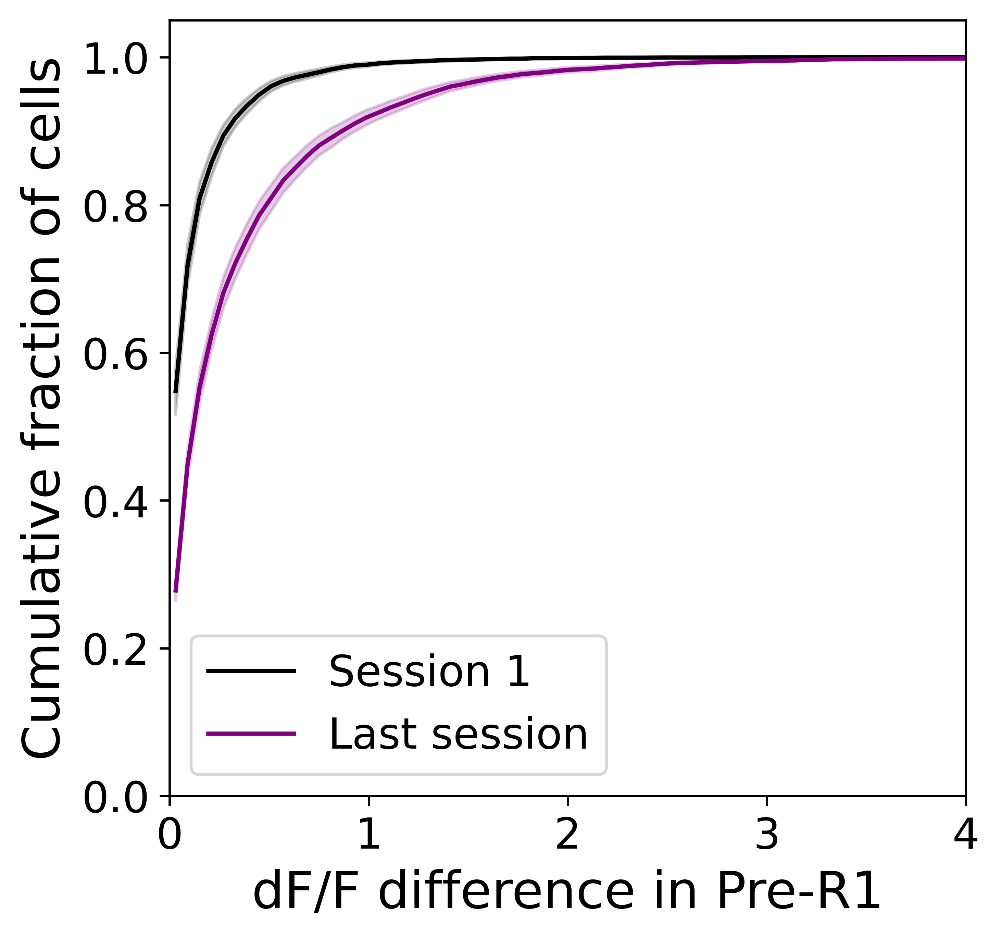

In [90]:
# Calculate the mean and standard error of the mean for each array along the 0th dimension
mean_s0 = np.mean(cumulative_fraction_all_s0, axis=0)
sem_s0 = np.std(cumulative_fraction_all_s0, axis=0) / np.sqrt(cumulative_fraction_all_s0.shape[0])
mean_s_end = np.mean(cumulative_fraction_all_s_end, axis=0)
sem_s_end = np.std(cumulative_fraction_all_s_end, axis=0) / np.sqrt(cumulative_fraction_all_s_end.shape[0])

# Set up the plot
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5, 5), dpi=600)

# Plot the means with shaded error bars
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
axs.plot(bin_centers, mean_s0, color='black', label='Session 1')
axs.fill_between(bin_centers, mean_s0 - sem_s0, mean_s0 + sem_s0, alpha=0.2, color='black')
axs.plot(bin_centers, mean_s_end, color='purple', label='Last session')
axs.fill_between(bin_centers, mean_s_end - sem_s_end, mean_s_end + sem_s_end, alpha=0.2, color='purple')

# Add labels and title to the subplot
axs.set_xlabel('dF/F difference in Pre-R1', fontsize=18)
axs.set_ylabel('Cumulative fraction of cells', fontsize=18)
axs.set_xlim([0, 4])
axs.set_ylim([0, 1.05])
axs.tick_params(labelsize=15)

# Add a legend to the plot
axs.legend(fontsize=15)
plt.savefig('stage_3_to_4.pdf', format='pdf', dpi=500)

# Show the plot
plt.show()


## do Wilcoxon rank-sum test, two-sided. 



In [91]:
from scipy import stats

# Perform the Mann-Whitney U test
U, p_value_U = stats.mannwhitneyu(animal_diff_all_s0_flat, animal_diff_all_end_flat, alternative='two-sided')

# Print the Mann-Whitney U result
print("Mann-Whitney U statistic:", U)
print("Mann-Whitney U p-value:", p_value_U)
if p_value_U == 0:
    print("Mann-Whitney U p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).")
else:
    print("Mann-Whitney U p-value:", p_value_U)

# Perform the Wilcoxon Rank Sum test
W, p_value_W = stats.ranksums(animal_diff_all_s0_flat, animal_diff_all_end_flat)

# Print the Wilcoxon Rank Sum result
print("Wilcoxon Rank Sum statistic:", W)
print("Wilcoxon Rank Sum p-value:", p_value_W)
if p_value_W == 0:
    print("Wilcoxon Rank Sum p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).")
else:
    print("Wilcoxon Rank Sum p-value:", p_value_W)

# Print statement about statistical significance 
print("If the p-value is less than 0.05, the Wilcoxon rank-sum test shows a statistically significant difference between the two groups.")


Mann-Whitney U statistic: 41317362.0
Mann-Whitney U p-value: 0.0
Mann-Whitney U p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).
Wilcoxon Rank Sum statistic: -51.143335487638794
Wilcoxon Rank Sum p-value: 0.0
Wilcoxon Rank Sum p-value is less than the precision of Python's floating-point arithmetic (typically around 1e-16 to 1e-308).
If the p-value is less than 0.05, the Wilcoxon rank-sum test shows a statistically significant difference between the two groups.


In [56]:
sorted_ind = Pre_R1_region_ind_all[2][np.argsort(np.abs(all_anm_Pre_R1_diff[2][-1]))]

In [57]:
#load stored place field analysis for each day
zarr_file = zarr.open(f'/nrs/spruston/Tyche/vr2p_datasets/placefields/Tyche-A7-SetA.zarr-PF.zarr', mode="r")

num_A_days = len(zarr_file[f'Cue Set A/1/excl_no_response/'])

range_A = range(num_A_days)
criteria = 'significant'

pf_all_T1 = [zarr_file[f'Cue Set A/1/excl_no_response/{i}/{criteria}'][()] for i in range_A]
pf_all_T2 = [zarr_file[f'Cue Set A/2/excl_no_response/{i}/{criteria}'][()] for i in range_A]

binF_T1 = [zarr_file[f'Cue Set A/1/excl_no_response/{i}/{criteria}'][()]['binF'] for i in range_A]
binF_T2 = [zarr_file[f'Cue Set A/2/excl_no_response/{i}/{criteria}'][()]['binF'] for i in range_A]

binF_T1_all = np.array(binF_T1).T
binF_T2_all = np.array(binF_T2).T

In [142]:
cell_array = sorted_ind[-200:]
session_range = np.arange(9)
# Determine the number of rows and columns for the subplots
num_cols = 10
num_rows = int(np.ceil(len(cell_array) / num_cols ))

x_start = 24
x_end = 27
vmax = 4
# Create the subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 4*num_rows), dpi=300)

# Iterate over the indices to plot
for i, ax in enumerate(axs.flatten()):
    if i < len(cell_array):
        index = cell_array[i]
        stacked_Near_Far = np.hstack((binF_T1_all[:,index,:],binF_T2_all[:,index,:])).T
        im = ax.imshow(stacked_Near_Far, aspect='auto', cmap='jet', vmin=0, vmax=vmax, interpolation=None)
        ax.set_title(f"Cell {index}")
        fig.colorbar(im, ax=ax)
        ax.axvline(x=x_start, linestyle='--', color='white', linewidth=1)
        ax.axvline(x=x_end, linestyle='--', color='white', linewidth=1)
        ax.axhline(y=9, linestyle='--', color='white', linewidth=1)



# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.3)

# Show the plot
plt.show()


0
1
2
3


/tmp/ipykernel_840341/3241781773.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


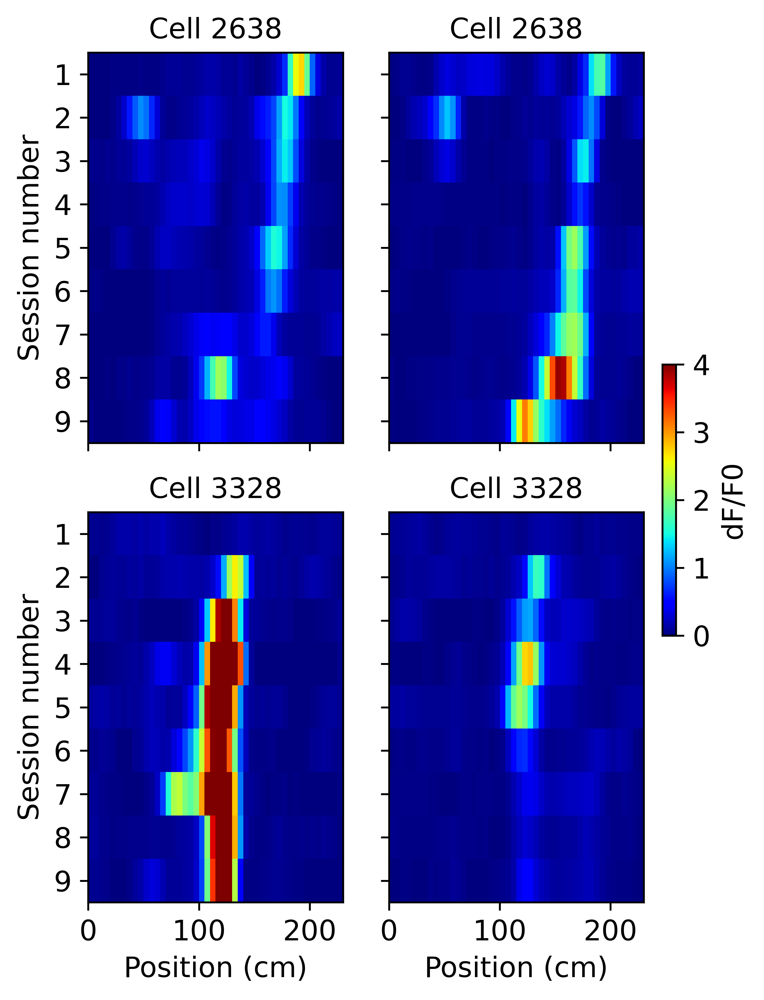

In [148]:
import figrid as fg

cell_num = [2638,3328]

x_start = 24*5
x_end = 27*5

vmin = 0
vmax = 4
region_marker_opacity = 0.1
dpi = 600

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(4,6), dpi=dpi, facecolor='white', sharex=True, sharey=True)

for i, ax in enumerate(axs.flat):
    q,r = divmod(i, 2) 
    # plot heatmap.
    if r == 0:
        x_extent = (0, 230,binF_T1_all[:,cell_num[q],:].T.shape[0],0)
        h = ax.imshow(binF_T1_all[:,cell_num[q],:].T, aspect='auto', cmap='jet', vmin=vmin, vmax=vmax, interpolation=None, extent=x_extent)
        ax.set_title(f'Cell {cell_num[q]}', fontsize=12)
    if r == 1:
        x_extent = (0, 230,binF_T2_all[:,cell_num[q],:].T.shape[0],0)
        h = ax.imshow(binF_T2_all[:,cell_num[q],:].T, aspect='auto', cmap='jet', vmin=vmin, vmax=vmax, interpolation=None, extent=x_extent)
        ax.set_title(f'Cell {cell_num[q]}', fontsize=12)

    # format axis.
    print(i)
    if i >= 2:
        ax.set_xlabel('Position (cm)', fontsize=12)
    if i % 2 == 0:
        ax.set_ylabel('Session number', fontsize=12)
        y_ticks = np.arange(0.5, 9.5)
        ax.set_yticks(y_ticks)
        ax.set_yticklabels(ylabels)
        
    else:
        ax.set_ylabel('', fontsize=12)
    ax.tick_params(axis='both', labelsize=12)
    #ax.set_title(f'Cell {cell_num[i]}', fontsize=12)
#     ax.axvline(x=x_start, linestyle='--', color='white', linewidth=1)
#     ax.axvline(x=x_end, linestyle='--', color='white', linewidth=1)



# colorbar.
# colorbar.
cbar = fig.colorbar(h, ax=axs.ravel().tolist(), label='dF/F0')
cbar.ax.set_position([0.99, 0.1, 0.02, 0.8])
cbar.ax.set_ylabel('dF/F0', fontsize=12)
cbar.ax.yaxis.set_tick_params(labelsize=12)

plt.tight_layout()
plt.savefig('Example_stage_3_4_cells.pdf', format='pdf', dpi=500) # This line saves the plot as a pdf with dpi = 500
plt.show()
